In [ ]:
# !pip install pandas-datareader
# !pip install yfinance

In [197]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import yfinance
import yfinance as yf

import pandas_datareader as pdr
import pandas_datareader.data as web
import datetime

In [296]:
# stock indices
# ^GSPC: S&P 500

# industrial materials
#  BZ=F: crude oil
#  NG=F: natural gas

# economic indices
#  GC=F: Gold price
#  EURUSD=X:  Euro/USD exchange rate

# other
#  ^VIX: CBOE Volatility Index
#  ^IXIC: NASDAQ Composite


tickers = ["^GSPC", 'AAPL', 'MSFT','GOOG','GOOGL','TSLA','AMZN','BRK-A','BRK-B','NVDA','META','UNH','BZ=F','NG=F', 'GC=F', 'EURUSD=X','^VIX','^IXIC']

stock_data = yfinance.download(tickers, start='2012-01-01', end="2022-11-22")
stock_data = stock_data['Close']


[*********************100%***********************]  18 of 18 completed


In [297]:
stock_data.shape

(2841, 18)

In [269]:
stock_data

,AMZN,BRK-A,BRK-B,BZ=F,EURUSD=X,GC=F,GOOG,GOOGL,META,MSFT,NG=F,NVDA,TSLA,UNH,^GSPC,^IXIC,^VIX
Date,,,,,,,,,,,,,,,,,
2012-01-02,NaN,NaN,NaN,NaN,1.296008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-01-03,8.951500,116320.000,77.680000,112.129997,1.294096,1599.699951,16.573130,16.651901,NaN,26.770000,2.993,3.510000,1.872000,51.490002,1277.060059,2648.719971,22.969999
2012-01-04,8.875500,115210.000,76.800003,113.699997,1.305602,1611.900024,16.644611,16.723724,NaN,27.400000,3.096,3.550000,1.847333,52.240002,1277.300049,2648.360107,22.219999
2012-01-05,8.880500,115650.000,76.930000,112.739998,1.293142,1619.400024,16.413727,16.491741,NaN,27.680000,2.980,3.677500,1.808000,52.590000,1281.060059,2669.860107,21.480000
2012-01-06,9.130500,114500.000,76.389999,113.059998,1.279607,1616.099976,16.189817,16.266768,NaN,28.110001,3.062,3.635000,1.794000,52.779999,1277.810059,2674.219971,20.629999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-15,98.940002,468233.000,309.980011,93.860001,1.031928,1773.800049,98.720001,98.440002,117.080002,241.970001,6.034,166.660004,194.419998,503.010010,3991.729980,11358.410156,24.540001
2022-11-16,97.120003,465520.000,308.760010,92.860001,1.035786,1773.000000,98.989998,98.849998,113.230003,241.729996,6.200,159.100006,186.919998,511.519989,3958.790039,11183.660156,24.110001
2022-11-17,94.849998,463695.000,307.440002,89.779999,1.039501,1760.800049,98.500000,98.360001,111.449997,241.679993,6.369,156.770004,183.169998,515.309998,3946.560059,11144.959961,23.930000


In [270]:
stock_data[stock_data.isna().any(axis=1)]

,AMZN,BRK-A,BRK-B,BZ=F,EURUSD=X,GC=F,GOOG,GOOGL,META,MSFT,NG=F,NVDA,TSLA,UNH,^GSPC,^IXIC,^VIX
Date,,,,,,,,,,,,,,,,,
2012-01-02,NaN,NaN,NaN,NaN,1.296008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-01-03,8.9515,116320.0,77.680000,112.129997,1.294096,1599.699951,16.573130,16.651901,NaN,26.770000,2.993,3.5100,1.872000,51.490002,1277.060059,2648.719971,22.969999
2012-01-04,8.8755,115210.0,76.800003,113.699997,1.305602,1611.900024,16.644611,16.723724,NaN,27.400000,3.096,3.5500,1.847333,52.240002,1277.300049,2648.360107,22.219999
2012-01-05,8.8805,115650.0,76.930000,112.739998,1.293142,1619.400024,16.413727,16.491741,NaN,27.680000,2.980,3.6775,1.808000,52.590000,1281.060059,2669.860107,21.480000
2012-01-06,9.1305,114500.0,76.389999,113.059998,1.279607,1616.099976,16.189817,16.266768,NaN,28.110001,3.062,3.6350,1.794000,52.779999,1277.810059,2674.219971,20.629999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-04-15,NaN,NaN,NaN,NaN,1.082099,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-05-30,NaN,NaN,NaN,NaN,1.073146,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-06-20,NaN,NaN,NaN,114.199997,1.049142,NaN,NaN,NaN,NaN,NaN,6.694,NaN,NaN,NaN,NaN,NaN,NaN


In [272]:
stock_data.isnull().sum()

AMZN        100
BRK-A       100
BRK-B       100
BZ=F        123
EURUSD=X      5
GC=F        102
GOOG        100
GOOGL       100
META        195
MSFT        100
NG=F        100
NVDA        100
TSLA        100
UNH         100
^GSPC       100
^IXIC       100
^VIX        100
dtype: int64

In [273]:
for i in stock_data.columns:
    stock_data[i].fillna(method='ffill', inplace=True)
    
stock_data = stock_data.dropna()
stock_data.shape

(2742, 17)

In [274]:
stock_data.isnull().sum()

AMZN        0
BRK-A       0
BRK-B       0
BZ=F        0
EURUSD=X    0
GC=F        0
GOOG        0
GOOGL       0
META        0
MSFT        0
NG=F        0
NVDA        0
TSLA        0
UNH         0
^GSPC       0
^IXIC       0
^VIX        0
dtype: int64

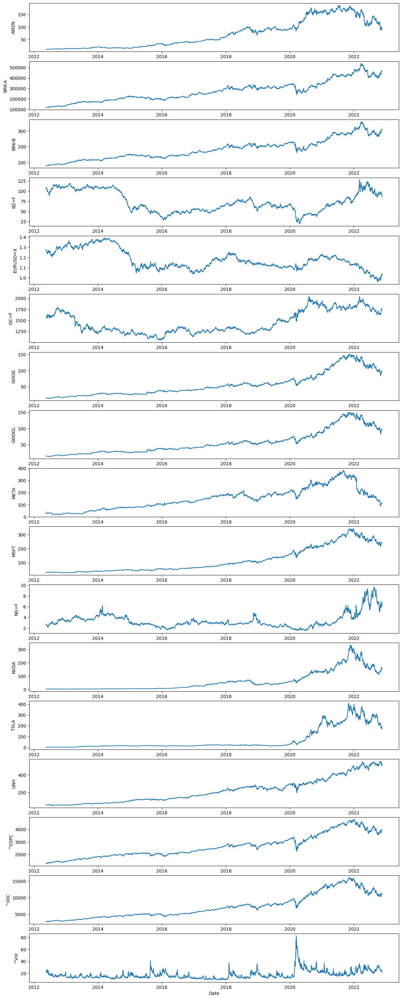

In [275]:
fig, ax = plt.subplots(stock_data.columns.shape[0], 1, figsize=(15, 40))
for i,c in enumerate(stock_data.columns):
    sns.lineplot(data=stock_data, x='Date', y=c, ax=ax[i])

## Other financial data 

In [276]:
# ther alternative financial data such as the Federal Reserve Economic Data, Fama/French Data, World Bank Development Indicators, etc.

# Effective Federal Funds Rate (EFFR), Daily
# Gross Domestic Product (GDP), Quarterly
# S&P/Case-Shiller U.S. National Home Price Index (CSUSHPISA): housing price, Monthly
# CPIAUCSL, CPILFESL (Monthly)


fred_labels = ['EFFR', 'CSUSHPISA', 'GDP', 'CPIAUCSL', 'CPILFESL']

fred_data = web.DataReader(fred_labels, 'fred', datetime.datetime(2012, 1, 1),datetime.datetime(2022, 11, 22))

In [277]:
fred_data.shape

(2878, 5)

In [278]:
fred_data.isnull().sum()

EFFR          142
CSUSHPISA    2750
GDP          2835
CPIAUCSL     2748
CPILFESL     2748
dtype: int64

In [279]:
for i in fred_data.columns:
    fred_data[i].fillna(method='ffill', inplace=True)

fred_data = fred_data.dropna()
fred_data

,EFFR,CSUSHPISA,GDP,CPIAUCSL,CPILFESL
DATE,,,,,
2012-01-03,0.07,136.609,16068.824,227.842,227.877
2012-01-04,0.07,136.609,16068.824,227.842,227.877
2012-01-05,0.07,136.609,16068.824,227.842,227.877
2012-01-06,0.07,136.609,16068.824,227.842,227.877
2012-01-09,0.08,136.609,16068.824,227.842,227.877
...,...,...,...,...,...
2022-11-14,3.83,301.929,25663.289,298.062,299.471
2022-11-15,3.83,301.929,25663.289,298.062,299.471
2022-11-16,3.83,301.929,25663.289,298.062,299.471


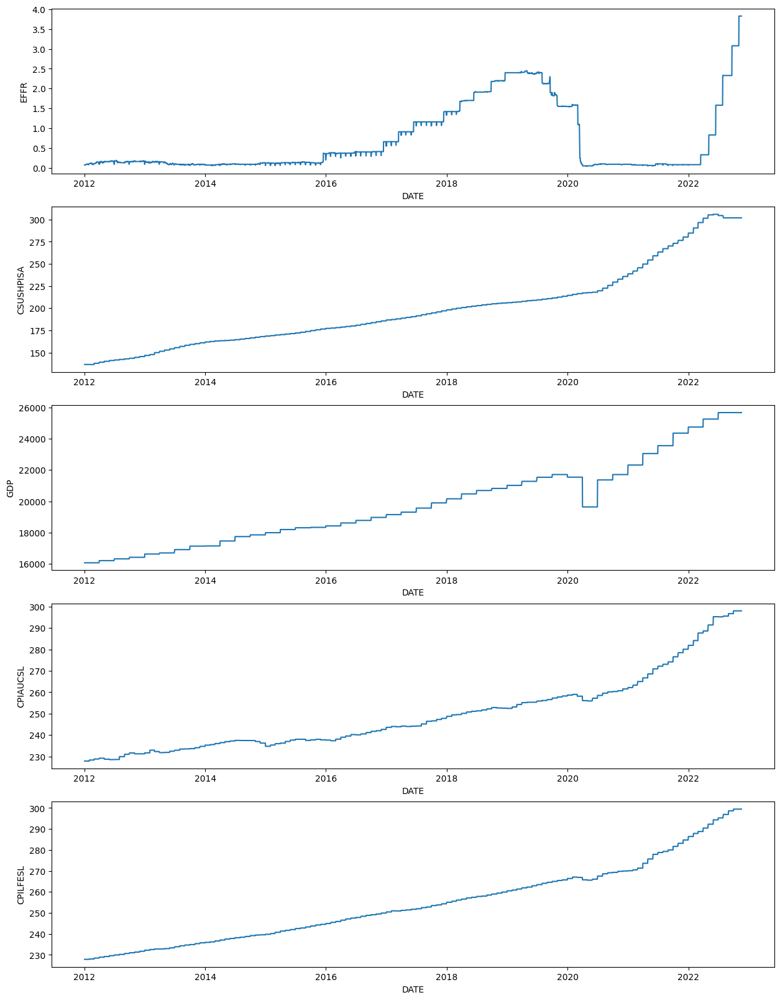

In [280]:
fig, ax = plt.subplots(fred_data.columns.shape[0], 1, figsize=(15, 20))
for i,c in enumerate(fred_data.columns):
    sns.lineplot(data=fred_data, x='DATE', y=c, ax=ax[i])

### Joins

In [281]:
stock_data.shape

(2742, 17)

In [282]:
fred_data.index.names = ['Date']
fred_data.shape

(2876, 5)

In [283]:
data_df = stock_data.join(fred_data)

for i in data_df.columns:
    data_df[i].fillna(method='ffill', inplace=True)

In [284]:
data_df.shape

(2742, 22)

In [286]:
data_df.isnull().sum()

AMZN         0
BRK-A        0
BRK-B        0
BZ=F         0
EURUSD=X     0
GC=F         0
GOOG         0
GOOGL        0
META         0
MSFT         0
NG=F         0
NVDA         0
TSLA         0
UNH          0
^GSPC        0
^IXIC        0
^VIX         0
EFFR         0
CSUSHPISA    0
GDP          0
CPIAUCSL     0
CPILFESL     0
dtype: int64

In [337]:
stock_data.head()

,AAPL,AMZN,BRK-A,BRK-B,BZ=F,EURUSD=X,GC=F,GOOG,GOOGL,META,MSFT,NG=F,NVDA,TSLA,UNH,^GSPC,^IXIC,^VIX
Date,,,,,,,,,,,,,,,,,,
2012-01-02,NaN,NaN,NaN,NaN,NaN,1.296008,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2012-01-03,14.686786,8.9515,116320.0,77.680000,112.129997,1.294096,1599.699951,16.573130,16.651901,NaN,26.770000,2.993,3.5100,1.872000,51.490002,1277.060059,2648.719971,22.969999
2012-01-04,14.765714,8.8755,115210.0,76.800003,113.699997,1.305602,1611.900024,16.644611,16.723724,NaN,27.400000,3.096,3.5500,1.847333,52.240002,1277.300049,2648.360107,22.219999
2012-01-05,14.929643,8.8805,115650.0,76.930000,112.739998,1.293142,1619.400024,16.413727,16.491741,NaN,27.680000,2.980,3.6775,1.808000,52.590000,1281.060059,2669.860107,21.480000
2012-01-06,15.085714,9.1305,114500.0,76.389999,113.059998,1.279607,1616.099976,16.189817,16.266768,NaN,28.110001,3.062,3.6350,1.794000,52.779999,1277.810059,2674.219971,20.629999


### Exploratory data analysis

In [287]:
data_df.describe()

,AMZN,BRK-A,BRK-B,BZ=F,EURUSD=X,GC=F,GOOG,GOOGL,META,MSFT,...,TSLA,UNH,^GSPC,^IXIC,^VIX,EFFR,CSUSHPISA,GDP,CPIAUCSL,CPILFESL
count,2742.000000,2742.000000,2742.000000,2742.000000,2742.000000,2742.000000,2742.000000,2742.000000,2742.000000,2742.000000,...,2742.000000,2742.000000,2742.000000,2742.000000,2742.000000,2742.000000,2742.000000,2742.000000,2742.000000,2742.000000
mean,69.886532,273294.586935,181.920941,73.089453,1.175726,1447.133989,56.375921,56.577464,148.159424,114.961778,...,67.936365,216.320062,2649.822885,7313.709995,17.779716,0.714106,201.067504,19952.671348,250.324677,255.338640
std,53.915050,94898.209500,63.019722,25.105421,0.095564,254.093834,35.524035,35.036182,87.402100,89.288449,...,100.393336,137.264849,899.423606,3563.882059,7.161011,0.852158,43.512491,2587.831977,17.430640,18.097948
min,10.411000,118850.000000,78.830002,19.330000,0.959619,1050.800049,13.924059,13.990240,17.730000,26.370001,...,1.740000,51.000000,1278.040039,2747.479980,9.140000,0.040000,140.157000,16207.130000,228.524000,229.224000
25%,18.791500,201159.500000,134.102497,52.362500,1.109906,1246.149994,28.149364,28.537501,77.562498,44.412501,...,13.812667,102.680000,1987.020020,4624.500122,13.120000,0.090000,168.660000,17991.348000,237.231000,239.811000
50%,49.382252,263047.000000,175.394997,66.594997,1.148679,1323.700012,47.483250,48.389750,144.125000,73.325001,...,17.668333,193.740005,2461.020020,6362.794922,15.720000,0.160000,192.708000,19561.896000,245.183000,252.535000
75%,100.850374,322777.500000,215.047504,100.009998,1.232567,1704.950012,70.157251,70.158373,191.774998,174.565006,...,50.186168,290.917496,3133.359924,9190.529785,20.665000,1.417500,217.297000,21538.032000,258.263000,266.418000
max,186.570496,539180.000000,359.570007,127.980003,1.393088,2051.500000,150.709000,149.838501,382.179993,343.109985,...,409.970001,555.150024,4796.560059,16057.440430,82.690002,3.830000,305.923000,25663.289000,298.062000,299.471000


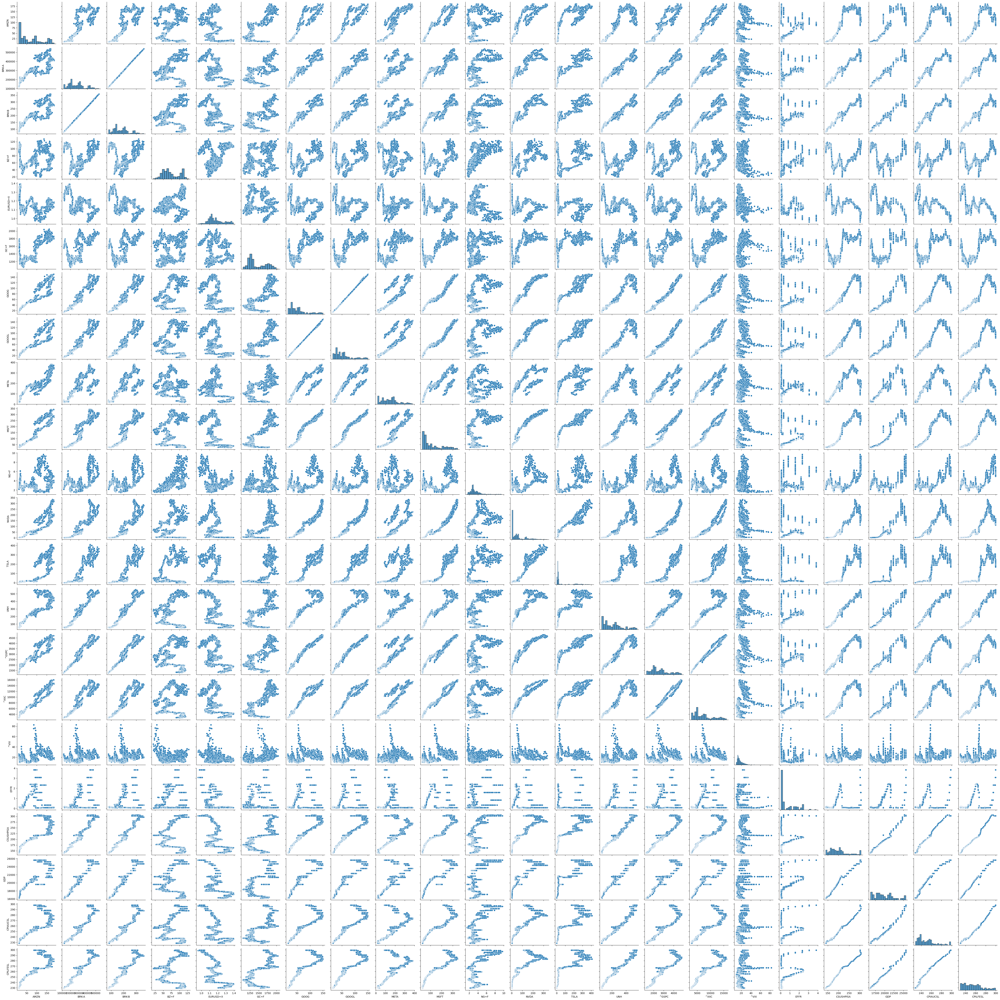

In [288]:
sns.pairplot(data_df)

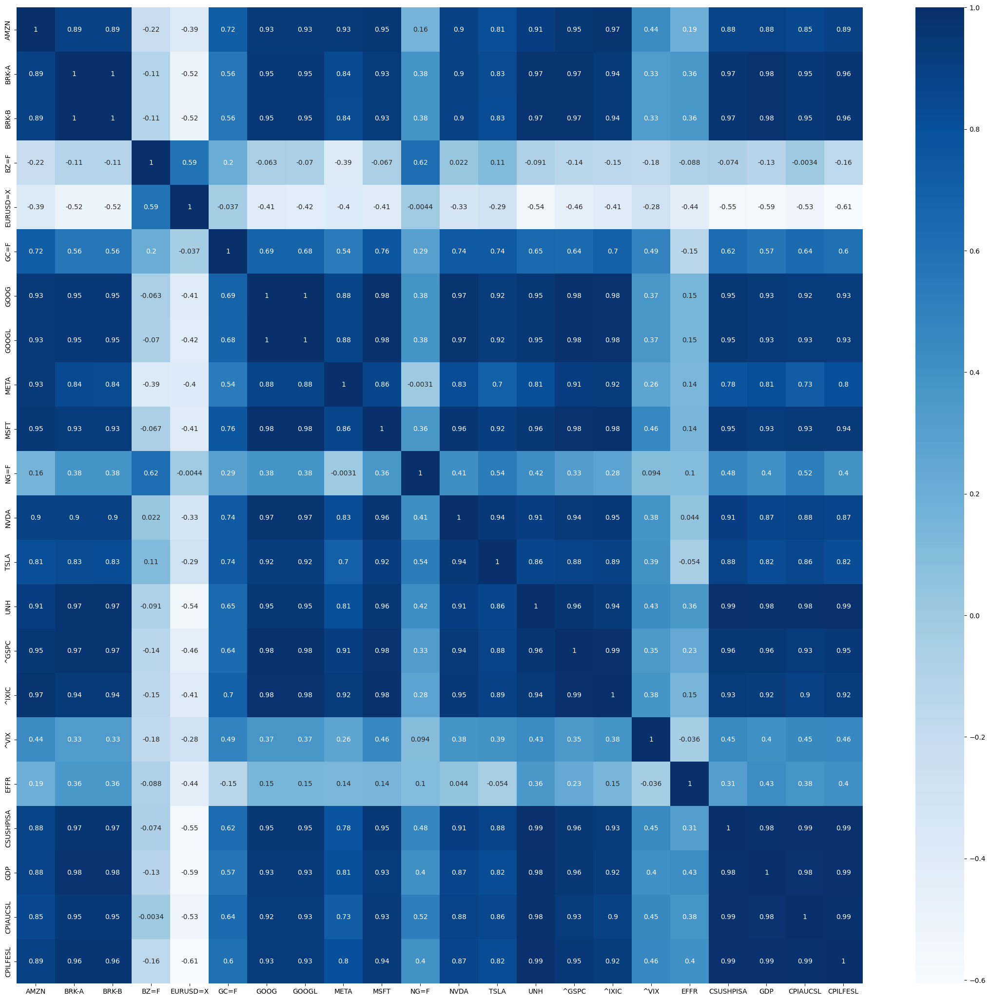

In [289]:
corr_df = data_df.corr(method='pearson')
plt.figure(figsize=(28, 26))
sns.heatmap(corr_df, annot=True, cmap="Blues")
plt.show()

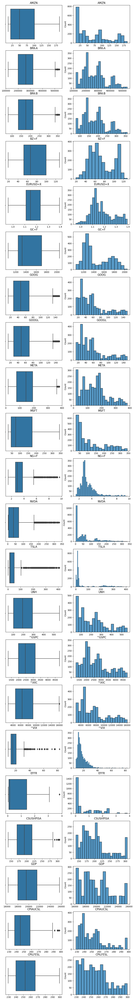

In [336]:
fig, ax = plt.subplots(data_df.columns.shape[0], 2, figsize=(10, 80))
for i,column in enumerate(data_df.columns):
    _ = sns.boxplot(x=data_df[column], ax=ax[i][0])
    _ = sns.histplot(data=data_df, x=column, ax=ax[i][1])
    _ = ax[i][0].set_title(f"{column}")
    _ = ax[i][1].set_title(f"{column}")
    _ = ax[i][0].set_xlabel("")
    _ = ax[i][1].set_xlabel("")